<a href="https://colab.research.google.com/github/escuccim/pytorch-face-autoencoder/blob/master/FaceClassifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torchvision
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
%matplotlib inline
import zipfile
import os
import shutil
from torch import optim
import numpy as np
from torch import nn
from torchvision import datasets

from google.colab import auth
auth.authenticate_user()

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'pneumonia'

!gcloud config set project {project_id}

Updated property [core/project].


To take a quick anonymous survey, run:
  $ gcloud alpha survey



In [2]:
!gsutil cp gs://{bucket_name}/classifier.pt ./classifier.pt

Copying gs://pneumonia/classifier.pt...
-
Operation completed over 1 objects/42.6 MiB.                                     


In [3]:
if not os.path.exists("classification.zip"):  
    !gsutil cp gs://{bucket_name}/classification.zip ./classification.zip
    zip_ref = zipfile.ZipFile('classification.zip', 'r')
    zip_ref.extractall('data/classifier')
    zip_ref.close()
    
if not os.path.exists("imdb_images3.zip"):  
  !gsutil cp gs://{bucket_name}/imdb_images3.zip ./imdb_images3.zip
  zip_ref = zipfile.ZipFile('imdb_images3.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()
    
# if not os.path.exists("wiki_images2.zip"):
#     !gsutil cp gs://{bucket_name}/wiki_images2.zip ./wiki_images.zip
#     zip_ref = zipfile.ZipFile('wiki_images.zip', 'r')
#     zip_ref.extractall('data/test_images')
#     zip_ref.close()    

Copying gs://pneumonia/classification.zip...
- [1 files][ 57.2 MiB/ 57.2 MiB]                                                
Operation completed over 1 objects/57.2 MiB.                                     
Copying gs://pneumonia/imdb_images3.zip...
| [1 files][  1.5 GiB/  1.5 GiB]   71.6 MiB/s                                   
Operation completed over 1 objects/1.5 GiB.                                      


In [0]:
class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    """Custom dataset that includes image file paths. Extends
    torchvision.datasets.ImageFolder
    """

    # override the __getitem__ method. this is the method that dataloader calls
    def __getitem__(self, index):
        # this is what ImageFolder normally returns 
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        # the image file path
        path = self.imgs[index][0]
        # make a new tuple that includes original and the path
        tuple_with_path = (original_tuple + (path,))

        return tuple_with_path

    def foo(self):
        return None

In [0]:
BATCH_SIZE = 24
data_path = "data/classifier/classification"


transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
#       torchvision.transforms.RandomApply([
#         torchvision.transforms.RandomAffine(degrees=3, translate=(0.02,0.02), scale=(0.95,1.05), shear=3, resample=False, fillcolor=0),        
#       ], 0.6),
      torchvision.transforms.RandomResizedCrop((200,200), scale=(0.9, 1.10)),
      torchvision.transforms.ToTensor(),
    ])

transform2 = torchvision.transforms.Compose(
    [torchvision.transforms.RandomResizedCrop((200,200), scale=(0.95, 1.05)),
      torchvision.transforms.ToTensor(),
    ])

def create_dataloaders(data_path, batch_size):
    train_dataset = torchvision.datasets.ImageFolder(
            root=data_path,
            transform=transform
        )

    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=batch_size,
        num_workers=2,
        shuffle=True
    )

    test_dataset = ImageFolderWithPaths(
            root="data/test_images",
            transform=transform2
        )

    test_loader = torch.utils.data.DataLoader(
        test_dataset,
        batch_size=16,
        num_workers=1,
        shuffle=True
    )
    
    return train_dataset, train_loader, test_dataset, test_loader
  
  
train_dataset, train_loader, test_dataset, test_loader = create_dataloaders(data_path, BATCH_SIZE)  

In [7]:
print(train_dataset)
print(test_dataset)

Dataset ImageFolder
    Number of datapoints: 9124
    Root location: data/classifier/classification
Dataset ImageFolderWithPaths
    Number of datapoints: 175274
    Root location: data/test_images


In [9]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # block 1
        self.conv1 = nn.Conv2d(3, 48, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(48)
        self.conv2 = nn.Conv2d(48, 48, 3, padding=1)        
        self.bn2 = nn.BatchNorm2d(48)
        self.conv3 = nn.Conv2d(48, 48, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(48)
        
        # block 2
        self.conv4 = nn.Conv2d(48, 96, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(96)
        self.conv5 = nn.Conv2d(96, 96, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(96)
        self.conv6 = nn.Conv2d(96, 96, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(96)
        
        # block 3
        self.conv7 = nn.Conv2d(96, 192, 3, padding=1)
        self.bn7 = nn.BatchNorm2d(192)
        self.conv8 = nn.Conv2d(192, 192, 3, padding=1)
        self.bn8 = nn.BatchNorm2d(192)
        self.conv9 = nn.Conv2d(192, 192, 3, padding=1)
        self.bn9 = nn.BatchNorm2d(192)
        
        # block 4
        self.conv10 = nn.Conv2d(192, 384, 3, padding=1)
        self.bn10 = nn.BatchNorm2d(384)
        self.conv11 = nn.Conv2d(384, 384, 3, padding=1)
        self.bn11 = nn.BatchNorm2d(384)
        
        # block 5
        self.conv12 = nn.Conv2d(384, 512, 3, padding=1)
        self.bn12 = nn.BatchNorm2d(512)
        self.conv13 = nn.Conv2d(512, 1024, 3, padding=1)
        self.bn13 = nn.BatchNorm2d(1024)
        
        self.fc1 = nn.Conv2d(1024, 1536, 1) # code layer
        self.bn14 = nn.BatchNorm2d(1536)
        self.fc2 = nn.Conv2d(1536, 1, 1)
        
        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(2,2)
        self.gap = nn.AdaptiveMaxPool2d(1)
        
        self.dropout1 = nn.Dropout2d(0.25)
        self.dropout2 = nn.Dropout2d(0.50)
        
    def discriminate(self, x):
        # input 192x160x3 - output 96x80x32
        h1 = self.relu(self.bn1(self.conv1(x)))
        h2 = self.relu(self.bn2(self.conv2(h1)))
        h3 = self.relu(self.bn3(self.conv3(h2)))
        mp1 = self.max_pool(h3)
        
        # input 89x89x32 - output 64x48x40
        h4 = self.relu(self.bn4(self.conv4(mp1)))
        h5 = self.relu(self.bn5(self.conv5(h4)))
        h6 = self.relu(self.bn6(self.conv6(h5)))
        mp2 = self.max_pool(h6)
        
        # input 54x44x64 - output 128x24x20
        h7 = self.relu(self.bn7(self.conv7(mp2)))
        h8 = self.relu(self.bn8(self.conv8(h7)))
        h9 = self.relu(self.bn9(self.conv9(h8)))
        mp3 = self.max_pool(h9)
        
        # input 128x22x22 - output 256x12x10
        h10 = self.relu(self.bn10(self.conv10(mp3)))
        h11 = self.relu(self.bn11(self.conv11(h10)))
        mp4 = self.max_pool(h11)
        
        # input 256x11x11 - output 384x6x5
        h12 = self.relu(self.bn12(self.conv12(mp4)))
        h13 = self.relu(self.bn13(self.conv13(h12)))
        mp5 = self.max_pool(h13)
        gap = self.dropout1(self.gap(mp5))
        
        # input 4x4x64 - output latent_dimx1
        fc1 = self.dropout2(self.relu(self.bn14(self.fc1(gap))))
        logits = self.fc2(fc1)
        
        return torch.squeeze(logits)
  
    def forward(self, x):
        return self.discriminate(x)
    
model = Discriminator()
optimizer = optim.Adam(model.parameters(), lr=0.001)

use_cuda = True

if use_cuda:
    model.cuda()
    

try:
    model.load_state_dict(torch.load("classifier.pt"), strict = False)
    print("Model loaded")
except:
    print("Error loading model")    

Model loaded


In [46]:
# pretrained_dict = torch.load("disc_model_3_e.pt")

# model_dict = model.state_dict()
# pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict}


# pretrained_dict.pop("fc1.weight")
# pretrained_dict.pop("fc2.weight")
# pretrained_dict.pop("fc1.bias")
# pretrained_dict.pop("fc2.bias")
# pretrained_dict.pop("bn14.weight")
# pretrained_dict.pop("bn14.bias")
# pretrained_dict.pop("bn14.running_mean")
# pretrained_dict.pop("bn14.running_var")

# # 2. overwrite entries in the existing state dict
# model_dict.update(pretrained_dict) 
# # 3. load the new state dict
# model.load_state_dict(model_dict, strict = False)

IncompatibleKeys(missing_keys=[], unexpected_keys=[])

In [0]:
def train(model, train_loader, optimizer, scheduler=None, test_loader=None, num_epochs=10, print_every=200, save_path="classifier.pt"):
    
    pos_weight = torch.FloatTensor([.2]).cuda()
    loss_function = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
    
    try:
        for epoch in range(num_epochs):
            model.train()
            epoch_losses = []
            epoch_accuracies = []

            for j, (inputs, labels) in enumerate(train_loader):
                if inputs.shape[0] > 2:
                    if use_cuda and torch.cuda.is_available():
                        inputs = inputs.cuda()
                        labels = labels.cuda().float()
                    else:
                        labels = labels.float()

                    optimizer.zero_grad()

                    logits = model(inputs)

                    loss = loss_function(logits, labels)

                    loss.backward()
                    optimizer.step()

                    epoch_losses.append(loss.item())

                    # calculate the accuracy
                    preds = torch.sigmoid(logits).round()
                    accuracy = torch.mean((preds == labels).double())
                    epoch_accuracies.append(accuracy.item())

                    if j % print_every == 0:
                        print("\tBatch", j, "Loss:", np.mean(epoch_losses), "Accuracy:", np.mean(epoch_accuracies))

            if test_loader is not None:
                model.eval()

                test_losses = []
                test_accuracies = []

                for (inputs, labels) in test_loader:
                    if use_cuda and torch.cuda.is_available():
                        inputs = inputs.cuda()
                        labels = labels.cuda().float()
                    else:
                        labels = labels.float()

                    logits = model(inputs)

                    loss = loss_function(logits, labels)
                    preds = torch.sigmoid(logits).round()
                    accuracy = torch.mean((preds == labels).double())
                    test_accuracies.append(accuracy.item())

                    test_losses.append(loss.item())
            else:
                test_accuracies = [0]
                test_losses = [0]

            print("Epoch", epoch, "Mean Train Loss:", np.mean(epoch_losses), "Mean Train Accuracy:", np.mean(epoch_accuracies), "Mean Test Accuracy:", np.mean(test_accuracies), "Test Loss:", np.mean(test_losses))
    except Exception as e:
        print("Error:", e)
        torch.save(model.state_dict(), save_path)
        !gsutil cp {save_path} gs://{bucket_name}/classifier.pt
        return
      
    torch.save(model.state_dict(), save_path)
    !gsutil cp {save_path} gs://{bucket_name}/classifier.pt
      
    return
  
def reclassify_files(model, test_loader, show_images=False):
    model.eval()
    counter = 0
    for (inputs, _, paths) in test_loader:
      logits = model(inputs.cuda())
      probs = torch.sigmoid(logits)
      counter += inputs.shape[0]
      
      if counter > len(test_dataset) // 20:
        return
      
      for image, prob, path in zip(inputs, probs, paths):
        if prob < 0.03:
            print("Bad:", path)
            if show_images:
                plt.imshow(image.cpu().permute(1,2,0))
                plt.title("Bad Pred:" + str(prob.item()))
                plt.show()
            file_name = path.split("/")[-1]
            shutil.move(path, "data/classifier/classification/bad/" + file_name)
        elif prob > 0.99:
            print("Good", path)
            if show_images:
                plt.imshow(image.cpu().permute(1,2,0))
                plt.title("Good Pred:" + str(prob.item()))
                plt.show()
            file_name = path.split("/")[-1]
            shutil.move(path, "data/classifier/classification/good/" + file_name)

In [0]:
train_dataset, train_loader, test_dataset, test_loader = create_dataloaders(data_path, BATCH_SIZE)  

In [26]:
# train_dataset, train_loader, test_dataset, test_loader = create_dataloaders(data_path, BATCH_SIZE)  
# reclassify_files(model, test_loader)
train_dataset, train_loader, test_dataset, test_loader = create_dataloaders(data_path, BATCH_SIZE)  
train(model, train_loader, optimizer, num_epochs=5)

	Batch 0 Loss: 0.013168316334486008 Accuracy: 1.0000000298023224
	Batch 100 Loss: 0.03068734786938876 Accuracy: 0.9616336920252531
	Batch 200 Loss: 0.03141301369991858 Accuracy: 0.9624792989992087
	Batch 300 Loss: 0.029355039157358577 Accuracy: 0.9655315902368768
	Batch 400 Loss: 0.027321664656819008 Accuracy: 0.9668537279001049
	Batch 500 Loss: 0.028293796463176132 Accuracy: 0.9658183920570833
	Batch 600 Loss: 0.028385269325443493 Accuracy: 0.9660981985091072
	Batch 700 Loss: 0.029775895520755106 Accuracy: 0.964812201839711
	Batch 800 Loss: 0.029706253889106915 Accuracy: 0.9648876692053308
Epoch 0 Mean Train Loss: 0.02963587903700472 Mean Train Accuracy: 0.9647020445416675 Mean Test Accuracy: 0.0 Test Loss: 0.0
	Batch 0 Loss: 0.003794290591031313 Accuracy: 1.0000000298023224
	Batch 100 Loss: 0.02510471756588483 Accuracy: 0.9686468935543948
	Batch 200 Loss: 0.025896980836975912 Accuracy: 0.9689055015124491
	Batch 300 Loss: 0.028730743448249996 Accuracy: 0.964701025428071
	Batch 400 Los

In [0]:
reclassify_files(model, test_loader)
train_dataset, train_loader, test_dataset, test_loader = create_dataloaders(data_path, BATCH_SIZE)
train(model, train_loader, optimizer, num_epochs=5) 

Good data/test_images/imdb_crop/23/nm0640323_rm2834407936_1967-6-12_2013.jpg
Bad: data/test_images/imdb_crop/61/nm0919361_rm3465137664_1943-5-27_1981.jpg
Good data/test_images/imdb_crop/56/nm0705356_rm1179704832_1989-7-23_2013.jpg
Good data/test_images/imdb_crop/34/nm0544334_rm144015360_1956-3-12_2010.jpg
Bad: data/test_images/imdb_crop/00/nm2584600_rm1978051072_1988-7-20_2012.jpg
Bad: data/test_images/imdb_crop/32/nm0764832_rm2798891520_1922-11-16_2010.jpg
Good data/test_images/imdb_crop/70/nm1779870_rm2677406464_1982-8-7_2014.jpg
Bad: data/test_images/imdb_crop/53/nm0000553_rm2956049152_1952-6-7_1999.jpg
Good data/test_images/imdb_crop/22/nm0736622_rm3305745408_1982-4-15_2012.jpg
Bad: data/test_images/imdb_crop/33/nm0177933_rm376604416_1951-7-9_2010.jpg
Bad: data/test_images/imdb_crop/88/nm0452288_rm2685371392_1948-10-17_1979.jpg
Good data/test_images/imdb_crop/94/nm0251594_rm2719909888_1968-10-26_2009.jpg
Bad: data/test_images/imdb_crop/47/nm0543547_rm1328644608_1950-4-5_2005.jpg
Ba

In [0]:
reclassify_files(model, test_loader)
train_dataset, train_loader, test_dataset, test_loader = create_dataloaders(data_path, BATCH_SIZE)
train(model, train_loader, optimizer, num_epochs=5) 

In [117]:
torch.save(model.state_dict(), "classifier.pt")
!gsutil cp "classifier.pt" gs://{bucket_name}/classifier.pt

Copying file://classifier.pt [Content-Type=application/octet-stream]...
-
Operation completed over 1 objects/42.6 MiB.                                     


Bad data/test_images/imdb_crop/60/nm0424060_rm3538733824_1984-11-22_2014.jpg


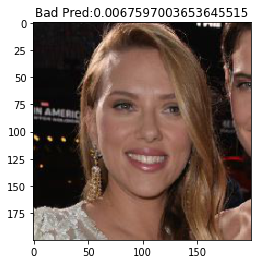

Bad data/test_images/imdb_crop/93/nm0124093_rm2496440832_1925-6-8_2012.jpg


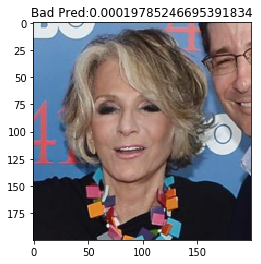

Good data/test_images/imdb_crop/43/nm0221043_rm947438336_1976-10-11_2005.jpg


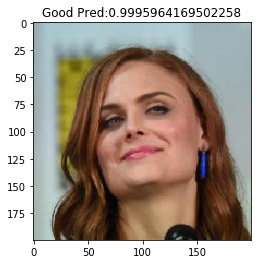

Good data/test_images/imdb_crop/75/nm1312575_rm213811456_1984-3-10_2004.jpg


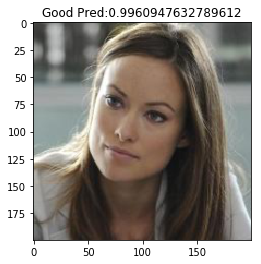

Good data/test_images/imdb_crop/70/nm0004770_rm912890368_1969-5-16_2004.jpg


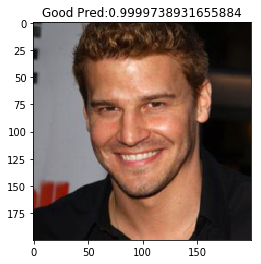

Good data/test_images/imdb_crop/88/nm1242688_rm1587145216_1992-10-12_2014.jpg


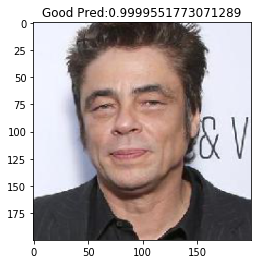

Bad data/test_images/imdb_crop/62/nm0728762_rm1675929344_1980-2-17_2013.jpg


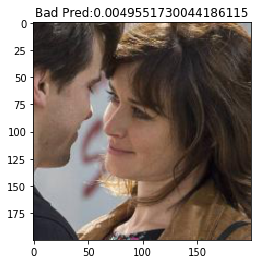

Bad data/test_images/imdb_crop/38/nm0000138_rm3342382592_1974-11-11_1997.jpg


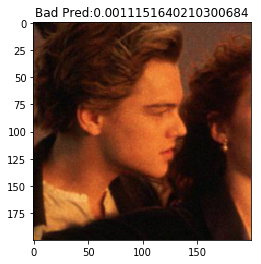

Bad data/test_images/imdb_crop/73/nm1682673_rm812289536_1980-6-5_2009.jpg


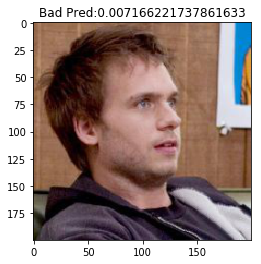

Good data/test_images/imdb_crop/82/nm0001482_rm168985088_1964-7-9_2010.jpg


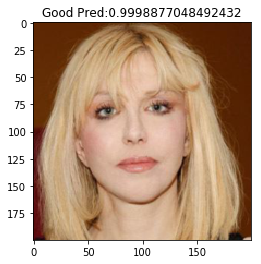

Good data/test_images/imdb_crop/07/nm0000207_rm263230464_1980-2-12_2008.jpg


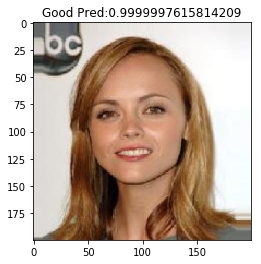

Bad data/test_images/imdb_crop/81/nm0005381_rm376097024_1972-11-6_1997.jpg


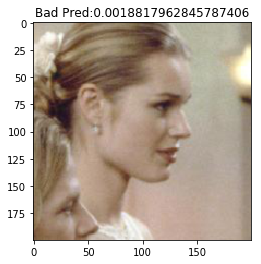

Good data/test_images/imdb_crop/98/nm2197298_rm902147328_1988-9-19_2006.jpg


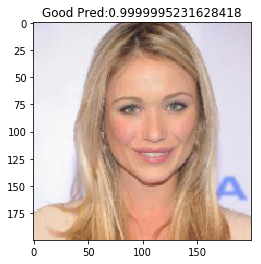

Bad data/test_images/imdb_crop/62/nm0005562_rm783071744_1968-11-18_2011.jpg


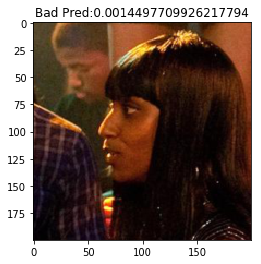

Good data/test_images/imdb_crop/05/nm0425005_rm841134080_1972-5-2_2012.jpg


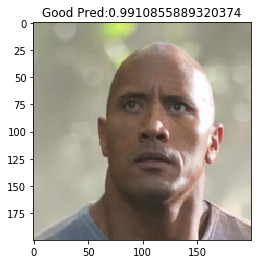

Bad data/test_images/imdb_crop/13/nm0001613_rm3398145024_1948-2-28_2005.jpg


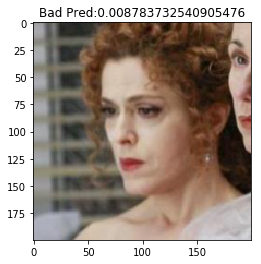

Good data/test_images/imdb_crop/42/nm0000242_rm3706047744_1971-6-5_2014.jpg


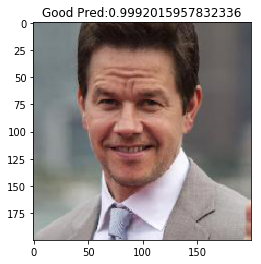

Bad data/test_images/imdb_crop/80/nm0000580_rm3816479488_1966-10-11_2013.jpg


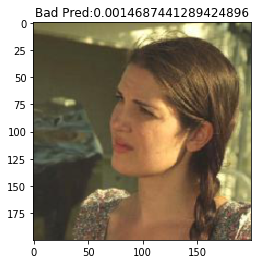

Good data/test_images/imdb_crop/00/nm2584600_rm505513728_1988-7-20_2010.jpg


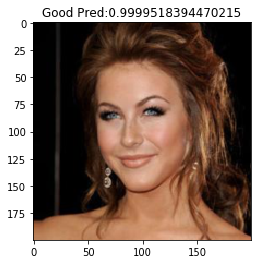

Bad data/test_images/imdb_crop/12/nm1365912_rm3339892480_1980-6-18_2012.jpg


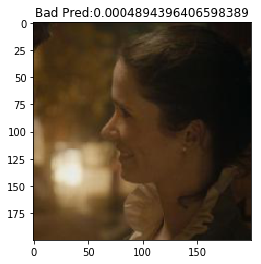

Bad data/test_images/imdb_crop/58/nm0000658_rm2949621760_1949-6-22_2012.jpg


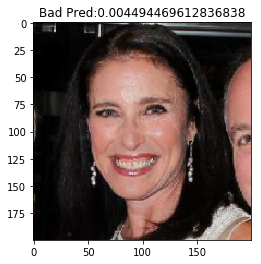

Good data/test_images/imdb_crop/24/nm0267124_rm232167424_1984-7-10_2006.jpg


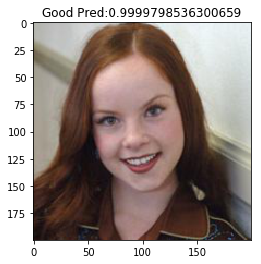

Bad data/test_images/imdb_crop/98/nm0000598_rm1704234240_1954-4-9_2004.jpg


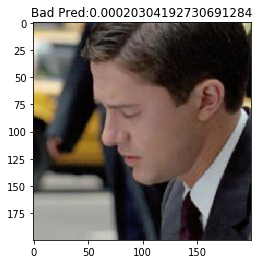

Bad data/test_images/imdb_crop/87/nm0000487_rm1734649600_1954-10-23_2013.jpg


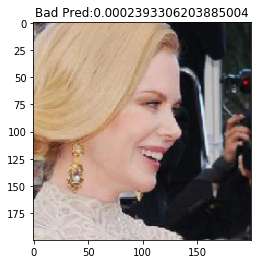

Good data/test_images/imdb_crop/82/nm5473782_rm3991993344_1989-11-10_2014.jpg


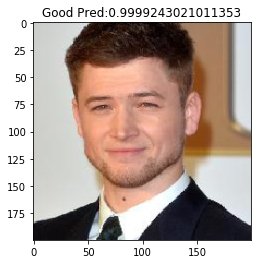

Good data/test_images/imdb_crop/70/nm0000170_rm2592450816_1975-12-17_2012.jpg


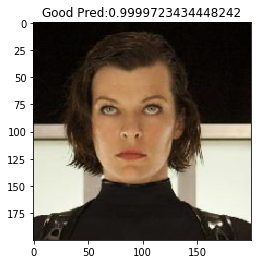

Bad data/test_images/imdb_crop/59/nm0206359_rm4229102336_1976-2-9_2014.jpg


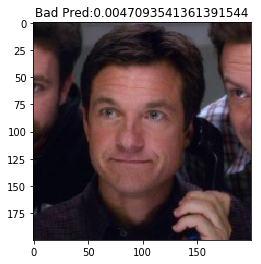

Bad data/test_images/imdb_crop/15/nm0000115_rm254195968_1964-1-7_2000.jpg


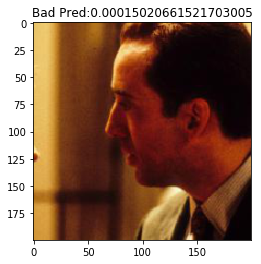

Bad data/test_images/imdb_crop/71/nm0000171_rm2046986752_1968-4-19_2009.jpg


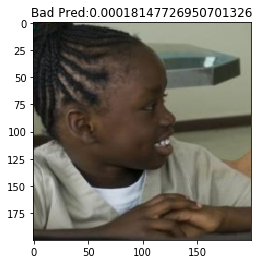

Bad data/test_images/imdb_crop/04/nm0339304_rm2085540864_1956-8-12_2014.jpg


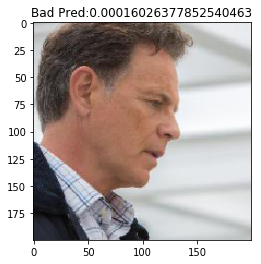

Good data/test_images/imdb_crop/67/nm1782667_rm4294947584_1983-4-1_2011.jpg


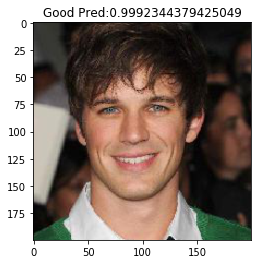

Good data/test_images/imdb_crop/15/nm0000215_rm36156928_1946-10-4_2011.jpg


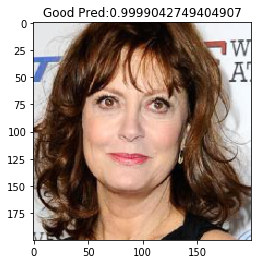

Good data/test_images/imdb_crop/35/nm0001035_rm910662144_1970-7-31_2001.jpg


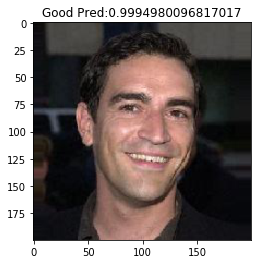

Good data/test_images/imdb_crop/13/nm3614913_rm2661982720_1994-11-10_2013.jpg


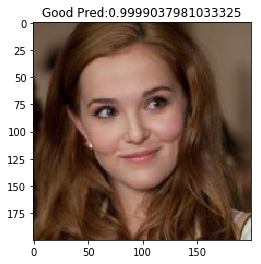

Bad data/test_images/imdb_crop/93/nm0001593_rm1098824704_1982-7-24_2008.jpg


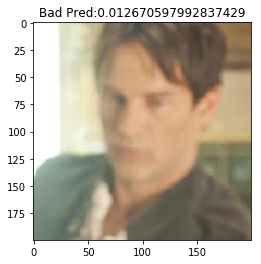

Good data/test_images/imdb_crop/60/nm0424060_rm1331617280_1984-11-22_2013.jpg


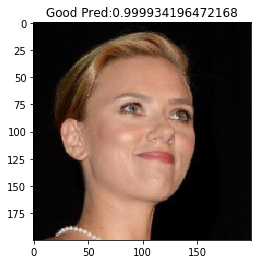

Bad data/test_images/imdb_crop/12/nm0001212_rm3476028416_1970-5-27_2015.jpg


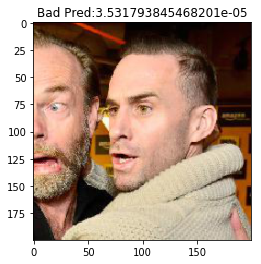

Good data/test_images/imdb_crop/10/nm0000110_rm1358672640_1960-12-10_2011.jpg


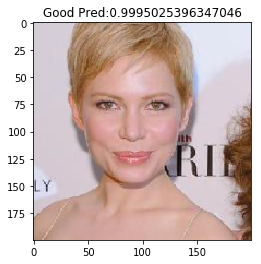

Bad data/test_images/imdb_crop/74/nm0704474_rm2193217536_1979-2-14_2008.jpg


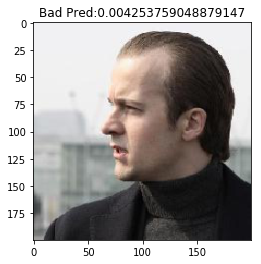

Bad data/test_images/imdb_crop/18/nm1715118_rm350204416_1987-7-16_2008.jpg


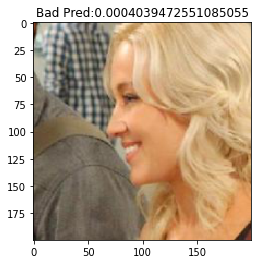

Bad data/test_images/imdb_crop/10/nm0075710_rm1378405376_1952-4-22_2007.jpg


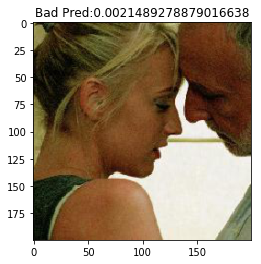

Bad data/test_images/imdb_crop/51/nm0000451_rm2241451008_1982-1-8_2014.jpg


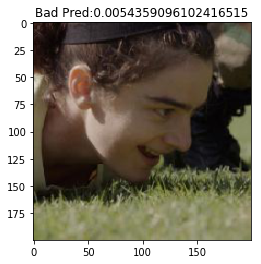

Good data/test_images/imdb_crop/03/nm0445903_rm3851418624_1986-8-1_2015.jpg


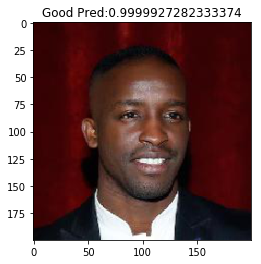

Good data/test_images/imdb_crop/10/nm0991810_rm1853473536_1974-2-16_2014.jpg


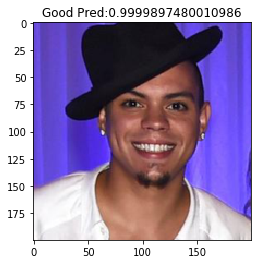

Good data/test_images/imdb_crop/70/nm1581670_rm4063611392_1971-4-29_2012.jpg


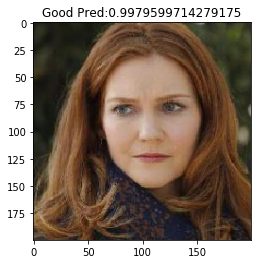

Bad data/test_images/imdb_crop/12/nm0914612_rm2710808576_1990-4-15_2012.jpg


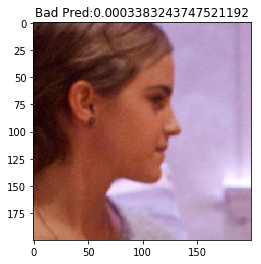

Bad data/test_images/imdb_crop/41/nm0786641_rm328054528_1967-8-12_2011.jpg


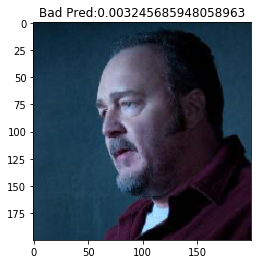

Good data/test_images/imdb_crop/08/nm2636108_rm2556341248_1983-6-19_2012.jpg


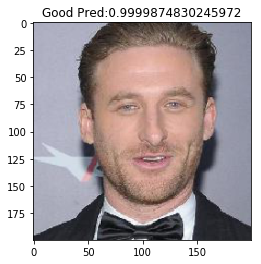

Bad data/test_images/imdb_crop/38/nm2127038_rm739358464_1987-5-13_2009.jpg


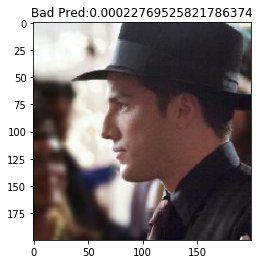

Bad data/test_images/imdb_crop/10/nm0004410_rm3135540480_1973-5-11_2006.jpg


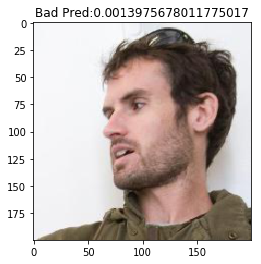

Bad data/test_images/imdb_crop/27/nm0233027_rm2316535552_1957-8-19_2010.jpg


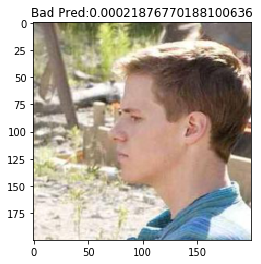

Good data/test_images/imdb_crop/49/nm1555549_rm233748480_1980-9-19_2010.jpg


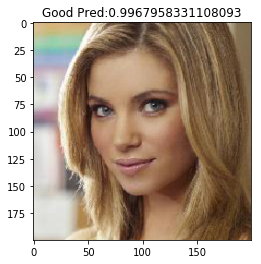

Bad data/test_images/imdb_crop/95/nm0579595_rm2645340672_1956-0-0_2010.jpg


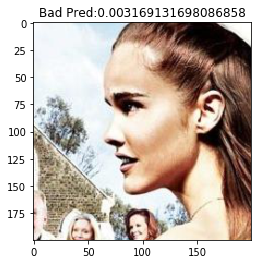

Good data/test_images/imdb_crop/38/nm2294338_rm1309537536_1989-8-25_2013.jpg


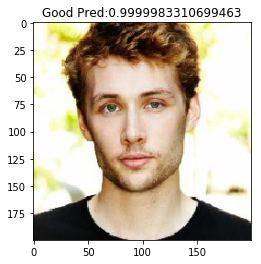

Bad data/test_images/imdb_crop/62/nm0005562_rm98411520_1968-11-18_2013.jpg


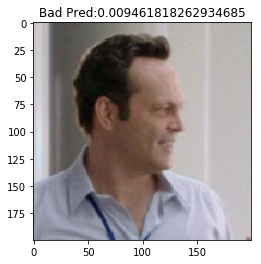

Good data/test_images/imdb_crop/70/nm1484270_rm45842432_1982-4-28_2009.jpg


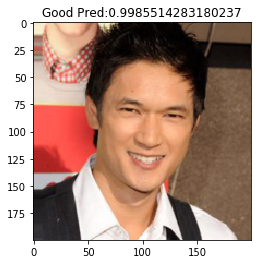

Good data/test_images/imdb_crop/52/nm0005452_rm1852557568_1969-9-25_2012.jpg


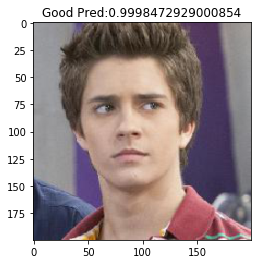

Good data/test_images/imdb_crop/18/nm0000218_rm844739328_1960-5-24_2008.jpg


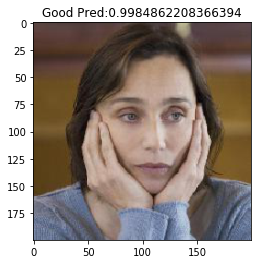

Bad data/test_images/imdb_crop/55/nm0757855_rm1974715136_1978-6-19_2014.jpg


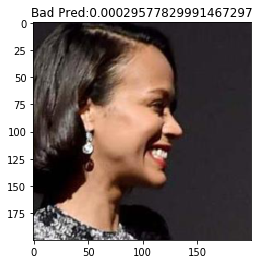

Good data/test_images/imdb_crop/97/nm0939697_rm3544746496_1987-9-7_2009.jpg


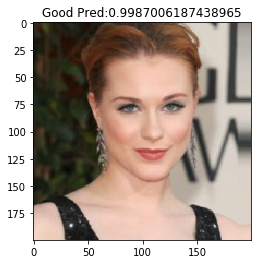

Bad data/test_images/imdb_crop/10/nm0000210_rm1780857344_1967-10-28_1988.jpg


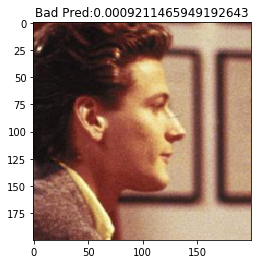

Good data/test_images/imdb_crop/17/nm0452817_rm828503808_1943-1-15_2015.jpg


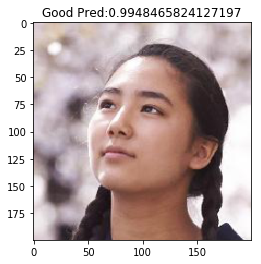

Bad data/test_images/imdb_crop/73/nm0001873_rm4192046080_1953-1-30_2006.jpg


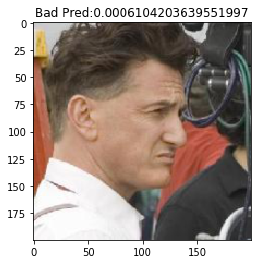

Good data/test_images/imdb_crop/65/nm0607865_rm1533260544_1971-12-1_2011.jpg


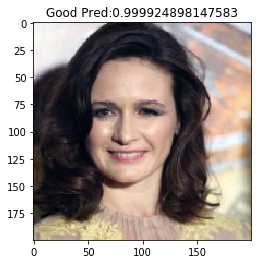

Good data/test_images/imdb_crop/06/nm0000206_rm4290160384_1964-9-2_2013.jpg


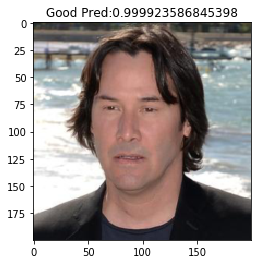

Good data/test_images/imdb_crop/45/nm2400045_rm923961600_1989-1-9_2009.jpg


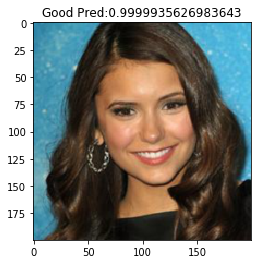

Bad data/test_images/imdb_crop/38/nm2127038_rm539013120_1987-5-13_2009.jpg


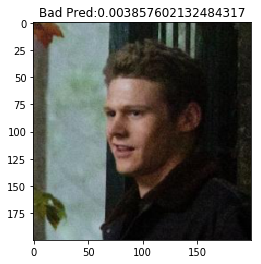

Bad data/test_images/imdb_crop/73/nm0001073_rm4075150592_1964-6-15_1994.jpg


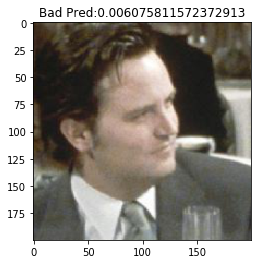

Bad data/test_images/imdb_crop/86/nm3841486_rm548260608_1981-12-5_2013.jpg


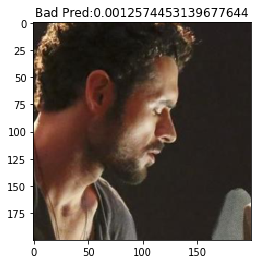

Bad data/test_images/imdb_crop/73/nm0001073_rm49995008_1964-6-15_1994.jpg


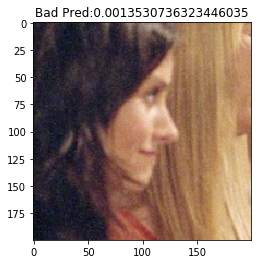

Good data/test_images/imdb_crop/54/nm2572554_rm900841472_1998-4-6_2011.jpg


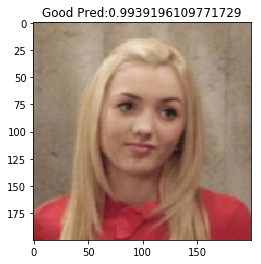

Good data/test_images/imdb_crop/38/nm1875238_rm262403584_1992-7-21_2015.jpg


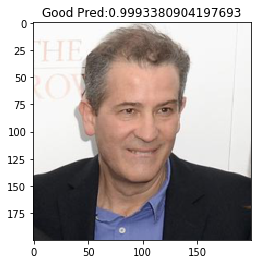

Good data/test_images/imdb_crop/71/nm1385871_rm3567894784_1979-11-14_2014.jpg


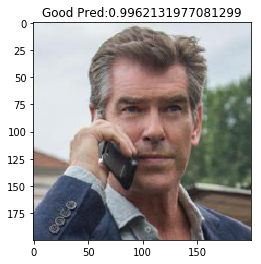

Good data/test_images/imdb_crop/80/nm2173080_rm2087837440_1983-5-2_2005.jpg


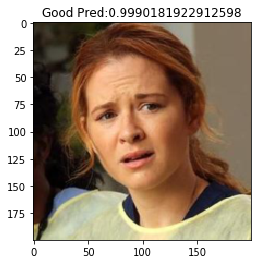

Bad data/test_images/imdb_crop/80/nm0001580_rm3527400448_1986-6-13_1987.jpg


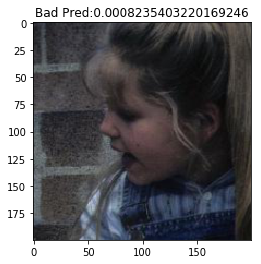

Good data/test_images/imdb_crop/98/nm0000498_rm780773632_1970-1-24_2012.jpg


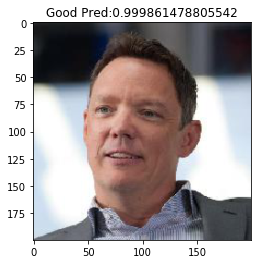

Good data/test_images/imdb_crop/37/nm0234237_rm733400832_1960-11-8_2014.jpg


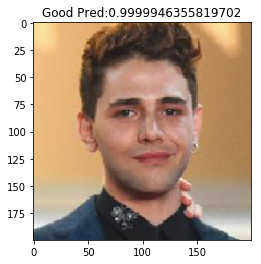

Bad data/test_images/imdb_crop/52/nm1792652_rm1182246656_1980-0-0_2013.jpg


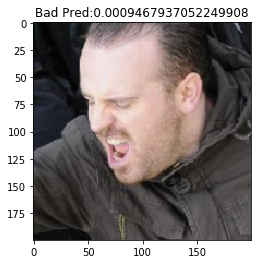

Bad data/test_images/imdb_crop/43/nm0001143_rm1878375680_1965-8-19_2011.jpg


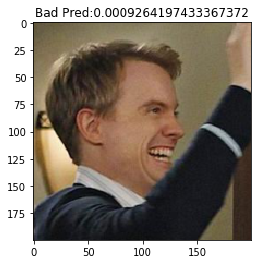

Bad data/test_images/imdb_crop/16/nm0358316_rm3785084416_1971-3-10_2014.jpg


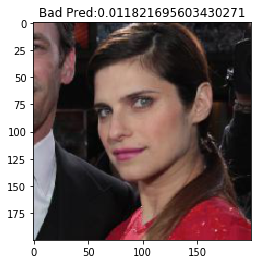

Bad data/test_images/imdb_crop/53/nm0601553_rm2955390976_1984-4-10_2002.jpg


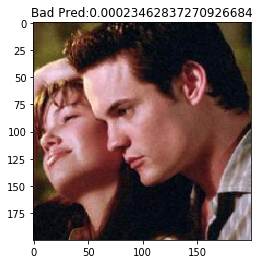

Bad data/test_images/imdb_crop/58/nm0005458_rm4108619008_1967-7-26_2006.jpg


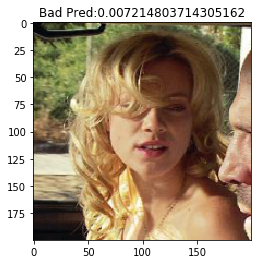

Bad data/test_images/imdb_crop/38/nm0000138_rm4253792000_1974-11-11_1997.jpg


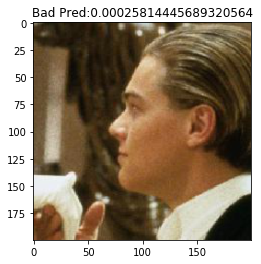

Good data/test_images/imdb_crop/21/nm1533421_rm582991872_1945-3-9_2013.jpg


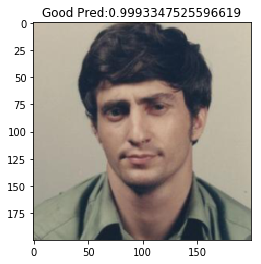

Bad data/test_images/imdb_crop/40/nm2279940_rm623045120_1984-7-27_2013.jpg


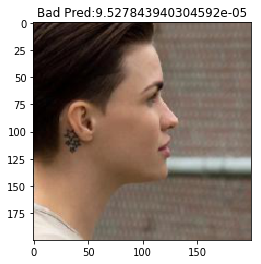

Bad data/test_images/imdb_crop/00/nm0004700_rm2850015488_1979-1-24_1990.jpg


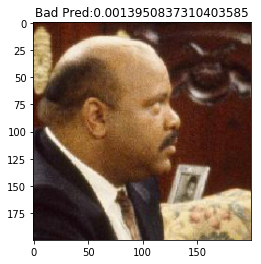

Bad data/test_images/imdb_crop/76/nm1411676_rm216122368_1979-6-24_2012.jpg


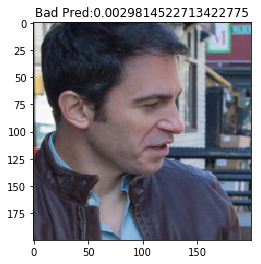

Good data/test_images/imdb_crop/63/nm0659363_rm2578486272_1989-8-21_2006.jpg


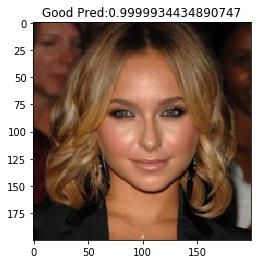

Good data/test_images/imdb_crop/02/nm1886602_rm540865024_1987-2-20_2015.jpg


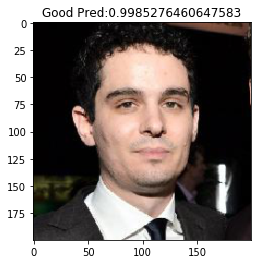

Bad data/test_images/imdb_crop/92/nm0001392_rm494387968_1961-10-31_2014.jpg


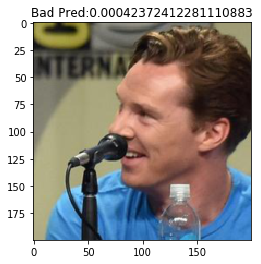

Good data/test_images/imdb_crop/67/nm0000867_rm2141102592_1969-1-14_2013.jpg


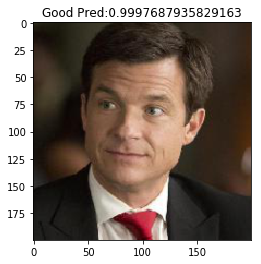

Good data/test_images/imdb_crop/66/nm1754366_rm903067648_1980-6-20_2010.jpg


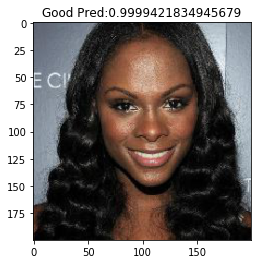

Good data/test_images/imdb_crop/86/nm0000286_rm1805163264_1966-5-12_2005.jpg


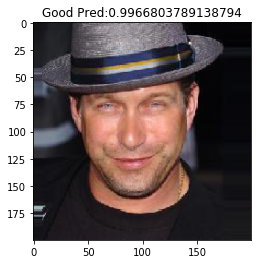

Bad data/test_images/imdb_crop/25/nm0746125_rm503499776_1979-10-9_2006.jpg


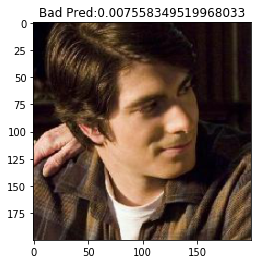

Bad data/test_images/imdb_crop/75/nm0000375_rm1736028928_1965-4-4_2011.jpg


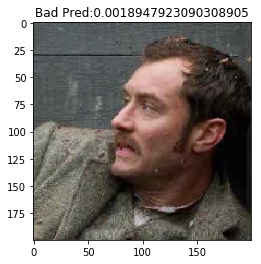

Bad data/test_images/imdb_crop/67/nm4446467_rm1578939392_1996-11-11_2012.jpg


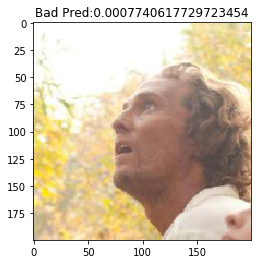

Good data/test_images/imdb_crop/14/nm0746714_rm885626880_1981-2-11_2006.jpg


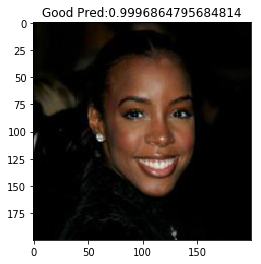

Good data/test_images/imdb_crop/22/nm0889522_rm3275207168_1962-9-24_2011.jpg


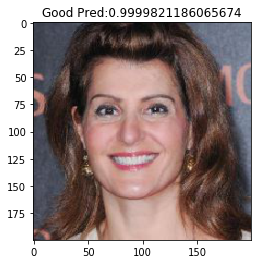

Good data/test_images/imdb_crop/70/nm0005370_rm89561856_1973-7-8_2002.jpg


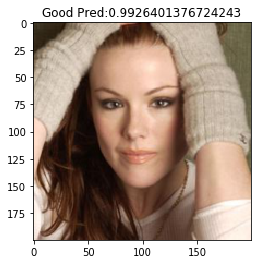

Good data/test_images/imdb_crop/27/nm0479527_rm2690774016_1978-4-29_2014.jpg


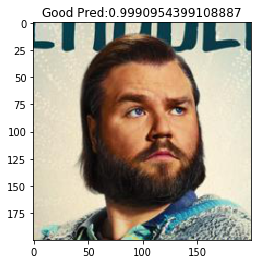

Good data/test_images/imdb_crop/90/nm0000490_rm563081216_1957-3-20_2015.jpg


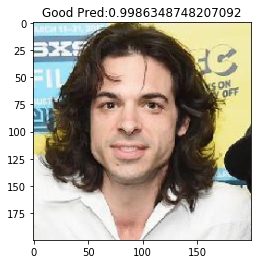

Bad data/test_images/imdb_crop/51/nm0000151_rm1134012160_1937-6-1_2013.jpg


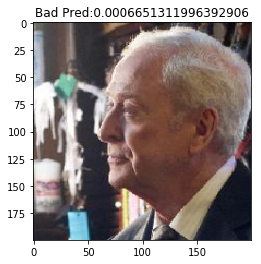

Bad data/test_images/imdb_crop/54/nm0314554_rm2216002816_1980-9-25_2010.jpg


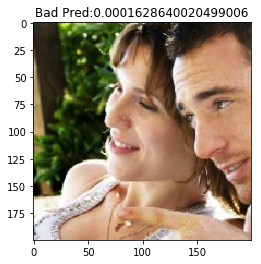

Bad data/test_images/imdb_crop/51/nm0000451_rm3423910656_1982-1-8_2009.jpg


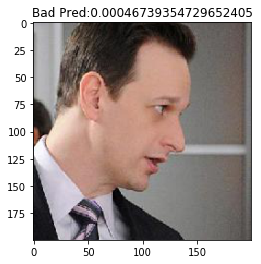

Good data/test_images/imdb_crop/30/nm0000230_rm170834688_1946-7-6_2011.jpg


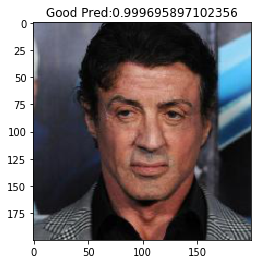

Bad data/test_images/imdb_crop/20/nm0517820_rm3391196160_1986-7-2_2004.jpg


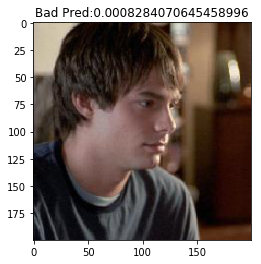

Good data/test_images/imdb_crop/00/nm0000200_rm4209892352_1955-5-17_2013.jpg


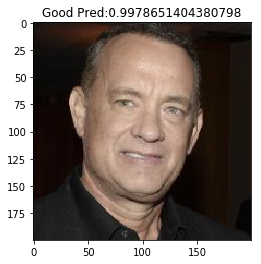

Good data/test_images/imdb_crop/45/nm3485845_rm3440166400_1983-11-19_2014.jpg


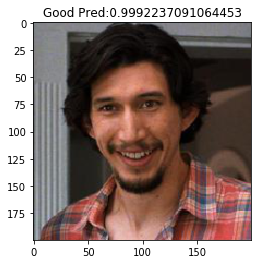

Good data/test_images/imdb_crop/20/nm4832920_rm2527373824_2003-8-28_2012.jpg


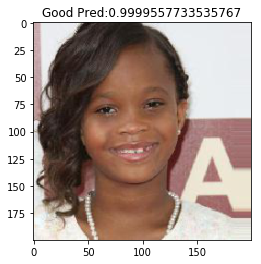

Good data/test_images/imdb_crop/41/nm0001741_rm1322048256_1965-9-17_2014.jpg


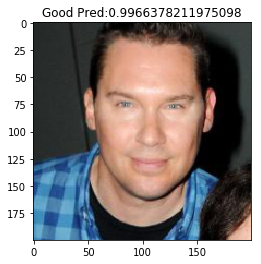

Bad data/test_images/imdb_crop/43/nm0221043_rm2247142400_1976-10-11_2005.jpg


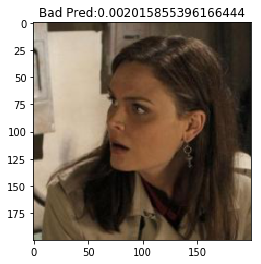

Good data/test_images/imdb_crop/53/nm1347153_rm1215605248_1969-9-14_2012.jpg


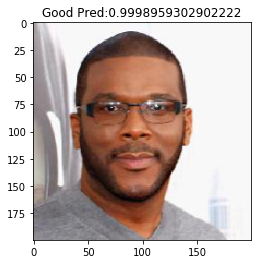

Bad data/test_images/imdb_crop/34/nm0295334_rm2873274112_1949-4-24_2011.jpg


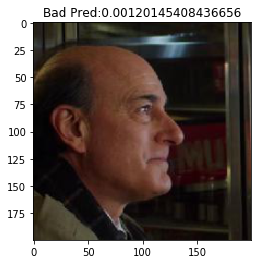

Good data/test_images/imdb_crop/52/nm0001852_rm3407710208_1951-12-1_2009.jpg


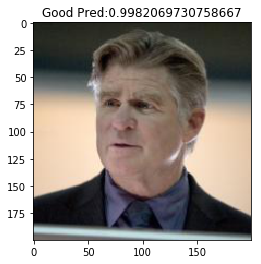

Bad data/test_images/imdb_crop/26/nm1843026_rm1461712896_1982-10-19_2014.jpg


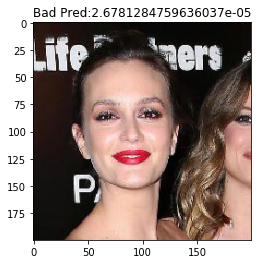

Good data/test_images/imdb_crop/53/nm2941353_rm958181888_1984-11-19_2011.jpg


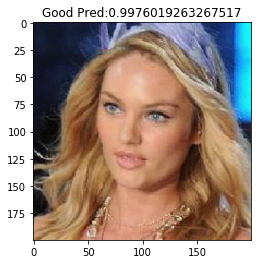

Bad data/test_images/imdb_crop/43/nm0000243_rm169651712_1954-12-28_2012.jpg


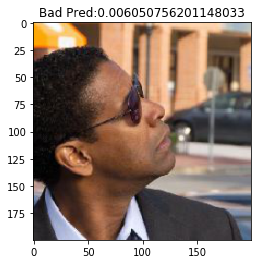

Good data/test_images/imdb_crop/35/nm0665235_rm3672110592_1976-7-18_2015.jpg


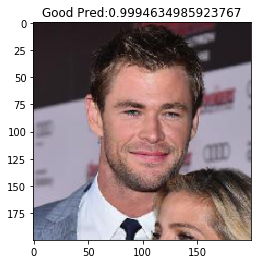

Bad data/test_images/imdb_crop/98/nm3297698_rm787857920_1990-2-19_2014.jpg


KeyboardInterrupt: ignored

In [23]:
model.eval()
for (inputs, _, paths) in test_loader:
  logits = model(inputs.cuda())
  probs = torch.sigmoid(logits)
  
  for image, prob, path in zip(inputs, probs, paths):
    if prob < 0.02:
        print("Bad", path)
        plt.imshow(image.cpu().permute(1,2,0))
        plt.title("Bad Pred:" + str(prob.item()))
        plt.show()
        file_name = path.split("/")[-1]
        shutil.move(path, "data/classifier/classification/bad/" + file_name)
    elif prob > 0.99:
        print("Good", path)
        plt.imshow(image.cpu().permute(1,2,0))
        plt.title("Good Pred:" + str(prob.item()))
        plt.show()
        file_name = path.split("/")[-1]
        shutil.move(path, "data/classifier/classification/good/" + file_name)
        
train_dataset, train_loader, test_dataset, test_loader = create_dataloaders(data_path, BATCH_SIZE)  

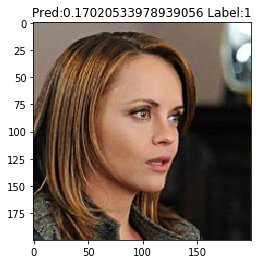

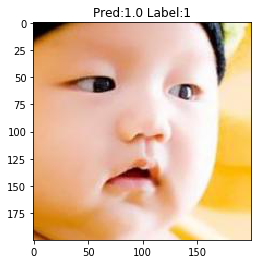

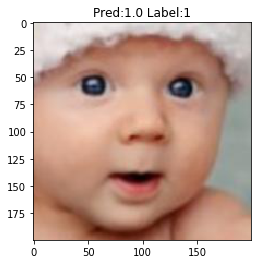

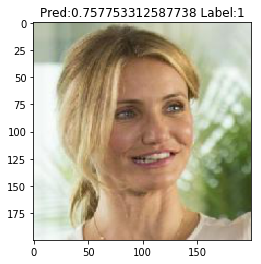

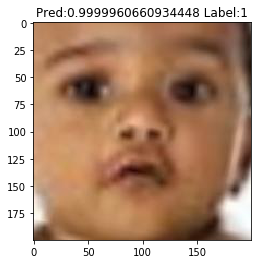

...

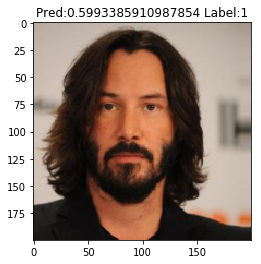

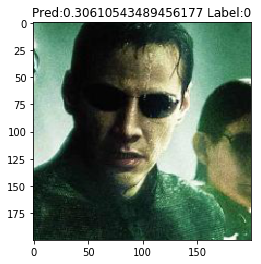

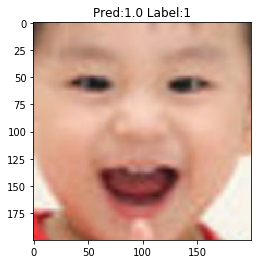

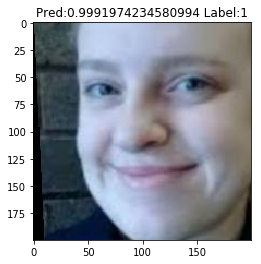

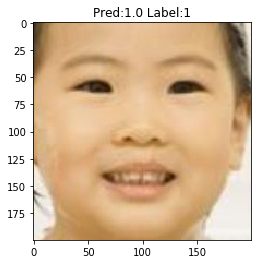

In [51]:
model.eval()
for (inputs, labels) in train_loader:
    logits = model(inputs.cuda())
    probs = torch.sigmoid(logits)
    
    for image,label, prob in zip(inputs, labels, probs):
        plt.imshow(image.cpu().permute(1,2,0))
        plt.title("Pred:" + str(prob.item()) + " Label:" + str(label.item()))
        plt.show()


    break